# Balanceo de Carga en Sistemas en la Nube

In [ ]:
#using Pkg;Pkg.instantiate(); Pkg.update()

Estudiaremos ahora el problema de **balanceo de carga**: cómo distribuir pedidos entrantes entre $N$ servidores para minimizar tiempos de espera. Veremos que la política de asignación tiene un impacto crucial en la performance, y que el análisis conecta herramientas ya conocidas (cadenas de Markov) con los **modelos de campo medio**.

## Motivación

En un sistema cloud moderno, miles de requests por segundo llegan a un *load balancer* que debe decidir a cuál de los $N$ servidores enviar cada request. La decisión esconde una tensión fundamental:

**La política óptima requiere conocer el estado de todos los servidores.** Con $N = 10.000$ servidores, consultar el estado de todos por cada request implica $O(N)$ mensajes — inaceptable a alta tasa de llegadas.

> *¿Cuánta información necesita un load balancer para tomar buenas decisiones?*

Veremos políticas que van desde cero información (Random, Round Robin) hasta información completa (JSQ), pasando por soluciones intermedias (PoD, JIQ) que logran performance casi óptima con overhead mínimo.

## Modelo formal

Consideramos $N$ servidores M/M/1 idénticos en paralelo:

- Requests llegan según un proceso de Poisson de tasa total $N\lambda$.
- Cada servidor tiene tasa de servicio exponencial $\mu$.
- La **carga por servidor** es $\rho = \lambda/\mu < 1$.

Al escalar el sistema proporcionalmente ($N$ servidores, tasa $N\lambda$), la carga individual $\rho$ permanece constante, pero el load balancer debe ser más rápido.

**Esquema:**

![load balancing](../images/load_balancing.png)

## Pregunta:

¿Cómo podemos hacer el reparto de carga de manera eficiente en el load balancer?

**Ideas:**

  * Rutear al azar (random). No requiere información de estado, simple y rápido.
  * Round-robin. Tampoco requiere información de estado de las colas. Garantiza cierto reparto uniforme.
  * Rutear al más corto (*join the shortest queue,JSQ*). **Problema:** requiere saber el estado de *cada cola* siendo $N$ muy grande!
      * Cada cola debe enviar periódicamente mensajes sobre sus partidas.
      * **Óptimo!**, pero inmanejable si $N$ crece...

## Política Random

A cada tarea se le asigna a uno de los $N$ servidores uniformemente al azar (probabilidad $1/N$).

* Poisson con tasa total de entrada $N\lambda$.
* Los trabajos al subsistema $i$ tienen entonces tasa $N\lambda (\frac{1}{N})=\lambda$.
* Por la propiedad de *thinning* de procesos de Poisson, cada servidor recibe Poisson($\lambda$). Las asignaciones son independientes, así que los servidores son **estadísticamente independientes**: cada uno es una cola M/M/1 con carga $\rho = \lambda/\mu$.
* El sistema es estable si y solo si $\rho<1$.

Por lo tanto:
* Ocupación del subsistema $i$:
  
  $$P(X_i=k) = (1-\rho)\rho^k,$$

  para cada $i$, e independientes entre sí.
* Retardo de un trabajo:

  $$W_{\text{rand}} = \frac{1}{\mu-\lambda}.$$

Este es nuestro **baseline**. No aprovecha ninguna información de estado.

## Política Round Robin

En esta política, los trabajos se reparten de forma circular. El primer request al $1$, el segundo al $2$ y así sucesivamente hasta $N+1\to 1$, etc.

**Observación:** Los arribos al subsistema $i$ ahora *no son Poisson* porque la selección 1 cada $N$ no es aleatoria.

* En particular el tiempo entre arribos es una suma de $N$ exponenciales independientes de tasa $N\lambda$.
* Si bien esto tiene distribución conocida (Erlang), para $N$ grande podemos usar la ley de grandes números y aproximarlo por llegadas periódicas cada $1/\lambda$.

Esto hace que el subsistema $i$ se comporte como una cola $D/M/1$ (llegadas determinísticas). Puede probarse que dicha cola verifica:

$$P(X_i=k) = (1-\sigma_0)\sigma_0^k,$$

donde $0<\sigma_0<1$ sale de resolver la ecuación:

$$e^{\frac{\sigma-1}{\rho}} = \sigma$$

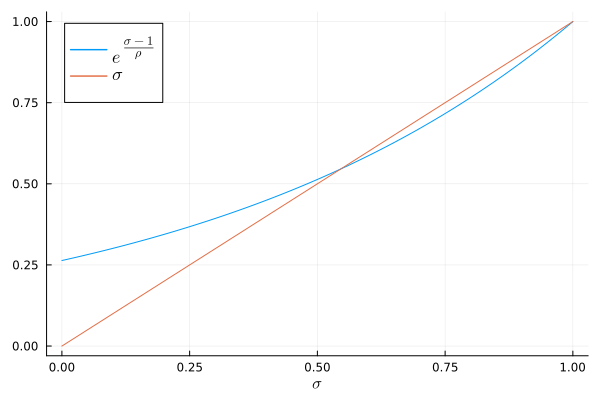

In [1]:
using Logging
global_logger(ConsoleLogger(stderr, Logging.Warn))
using Plots, LaTeXStrings

σ = (0:.01:1)
ρ = .75
plot(σ,exp.((σ.-1)/ρ), label=L"e^{\frac{\sigma-1}{\rho}}", xlabel=L"\sigma", legendfontsize=12)
plot!(σ, σ, label=L"\sigma")

**Observación:**

* La función $g(x) = e^{\frac{\sigma-1}{\rho}}$ es creciente en $\sigma$. $g(0)=e^{-1/\rho}>0$, $g(1)=1$.
* Calculemos la derivada en $1$:
  
     $$g'(1) = \left. \frac{1}{\rho}e^{\frac{\sigma-1}{\rho}} \right|_{\sigma=1} = \frac{1}{\rho}.$$

* Por lo tanto, existe una solución si y solo si $g'(1)>1$ es decir:
  
     $$\frac{1}{\rho} > 1 \Longleftrightarrow \rho < 1,$$

  la condición de estabilidad esperada.

* Se cumple además que:

     $$g'(\sigma_0) = \frac{1}{\rho} e^{\frac{\sigma_0 - 1}{\rho}} = \frac{\sigma_0}{\rho}$$

  y para que sea raíz es necesario que $g'(\sigma_0)<1$ por lo que:

    $$\sigma_0<\rho.$$
   
La conclusión es que round-robin es más eficiente que random, pero aún tiene un comportamiento geométrico en las colas.

#### Retardo medio en Round-Robin:

Aplicando adecuadamente la ley de little se obtiene que:

  $$W_{RR} = \frac{1}{\mu(1-\sigma_0)}.$$

Notar que es menor que $W_{\text{random}}$ ya que $\sigma_0<\rho$.
  

## Join the Shortest Queue (JSQ)

Cada trabajo se asigna al servidor con **menor número de clientes** (desempates al azar). Requiere conocer el estado de los $N$ servidores!

  * Por ejemplo, para implementarlo el dispatcher tiene que tener una lista de ocupación de cada cola.
  * Cada vez que envía un trabajo puede incrementar en $1$ ese subsistema en la lista.
  * Pero para que la lista esté actualizada, cada vez que un trabajo deja el susbsistema $i$ se debe enviar un mensaje al load balancer.
  * Si el sistema es estable, la tasa de salida de trabajos es $N\lambda$ por lo que necesitamos una tasa de mensajes $O(N)$, con $N$ grande,
  * Y una memoria $O(N)$ del estado de cada subsistema.

Alternativa: *pollear en cada arribo*

 * Los mensajes llegan a tasa $N\lambda$, y necesito pollear $N$ subsistemas $\longrightarrow O(N^2\lambda)$ mensajes.
 * No hay memoria, pero el problema se pasa a la tasa de mensajes.

### Modelo: cadena de Markov de tiempo continuo.

Supongamos que $\mathbf{n}(t) = (n_1(t),\ldots,n_N(t))$ es la cantidad de trabajos en cada subsistema. Definamos para cada $t$:

$$i^*(t) = \arg \min \{n_i(t),i=1,\ldots,N\},$$

la cola más descargada.

Entonces el proceso $\mathbf{n}(t)$ es una cadena de Markov de tiempo continuo con tasas de transición:

$$\begin{equation*}
\begin{cases}
\mathbf{n} \mapsto \mathbf{n}+\mathbf{e}_i & \text{con tasa } N\lambda \mathbf{1}_{\{i=i^*\}} \\
\mathbf{n} \mapsto \mathbf{n}-\mathbf{e}_i & \text{con tasa } \mu
\end{cases}
\end{equation*}$$

con desempates equiprobables en el caso de que haya varios $i$ que alcancen el mínimo.

#### Ejemplo, $N=2$

Diagrama:

![load balancing jsq](../images/load_balancing_jsq.png)

**Observaciones:**
 * Las trayectorias deberían ir hacia la diagonal (balance equitativo perfecto).
 * Si la fuerza de los servicios $2\mu$ le ganan al $2\lambda$ debería ser estable. ¿Podemos probar esto?

### Criterio de Foster-Lyapunov para cadenas de Markov de tiempo continuo.

El problema de la cadena anterior es que no tiene solución explícita. Sin embargo, existe un teorema muy útil para probar que es ergódica.

> **Teorema** (Foster-Lyapunov)
>
> Sea $\mathbf{n}(t)$ una CMTC irreducible e infinita y $V(\mathbf{n})$ una función escalar tal que $V\geqslant 0$ y tal que su *drift*:
>
> $$\Delta V := \sum_\mathbf{m\neq n} \left[V(\mathbf{m}) - V(\mathbf{n})\right]q_{\mathbf{n},\mathbf{m}} \leqslant -\varepsilon <0$$
>
> para todo $\mathbf{n}$ fuera de un conjunto finito $F$. Supongamos además que $\Delta V$ está acotado en $F$. Entonces la cadena es recurrente positiva.

**Idea:** La función $V$ tiende a bajar sobre las trayectorias de la cadena siempre que nos alejemos de $F$. Como la función es positiva, tenemos que volver a $F$ en tiempo finito.

### Estabilidad de JSQ

Tomamos $V(\mathbf{n}) = \sum_{i=1}^N n_i^2$. La drift bajo JSQ es entonces:

- **Llegada** (tasa $N\lambda$): va al servidor $i^* = \arg\min_i n_i$, incremento $\Delta V = 2n_{\min} + 1$.
- **Servicio** en $i$ (tasa $\mu \mathbf{1}_{n_i>0}$): decremento $\Delta V = -2n_i + 1$.

$$\Delta V(\mathbf{n}) = N\lambda(2n_{\min}+1) + \mu\sum_{i:n_j>0}(-2n_i+1) \leqslant N\lambda(2n_{\min}) -  \mu\sum_{i:n_i>0} 2n_i + N(\lambda+\mu)$$

Consideremos el término:

$$N\lambda(2n_{\min}) -  \mu\sum_{i:n_i>0} 2n_i.$$

En primer lugar observemos que podemos escribirlo como:

$$2\left[\lambda Nn_{\min} -  \mu\sum_{i} n_i\right],$$

ya que únicamente agregamos ceros a la suma, y sacamos $2$ de factor común.


Ahora, es trivial observar que:

$$n_\min \leqslant n_i \quad \forall i \Longrightarrow N n_\min \leqslant \sum_i n_i \Longrightarrow 2\left[\lambda Nn_{\min} -  \mu\sum_{i} n_i\right] \leqslant 2(\lambda-\mu)\sum_i n_i.$$

De donde:

$$\Delta V \leqslant N(\lambda+\mu) + 2 (\lambda-\mu) \sum_i n_i.$$

Como $\sum_i n_i \to \infty$ y $\lambda<\mu$, el $\Delta V$ se vuelve negativo fuera de un conjunto finito $F$, y por lo tanto la cadena es estable.

## Modelos de campo medio

Pasamos ahora a analizar un modelo aproximado que funciona bien para $N\to\infty$ y que permite analizar varias políticas, cuya cadena de Markov no se puede resolver como por ejemplo JSQ.

**Idea:** Si los servidores son "intercambiables", para conocer el estado del sistema solo tengo que saber cuántos de los $N$ hay con $k$ trabajos.

Definamos entonces la siguiente variable:

$$S_k = \#\{j : n_i \geqslant k\}, \qquad k = 0, 1, 2, \ldots,$$

la proporción de servidores con $k$ o más trabajos. Observemos que $S_0 \equiv 1$ y que si el sistema es estable, $S_k\to 0$ cuando $k\to \infty$.

**Observación:**

Calculemos el número total de trabajos en el sistema en función del estado $\{s_k\}$: 

Observemos que la cantidad de colas con $k$ trabajos es $N(s_k-s_{k+1}),\quad k=0,1,\ldots$, entonces:

$$\begin{align*}
X &= \sum_{k=0}^\infty k (S_k-S_{k+1}) = (0)(S_0-S_1) + (1)(S_1-S_2) + (2)(S_2-S_3) + \ldots \\
  &= S_1+S_2+S_3+\ldots = \sum_{k=1}^\infty S_k.
\end{align*}$$

Por la ley de Little entonces:

$$\bar{W} = \frac{1}{N\lambda} E\left[\sum_{k=1}^\infty S_k\right] = \frac{1}{\lambda} E\left[\frac{1}{N}\sum_{k=1}^\infty S_k\right].$$

### Ejemplo: política Random

Si llega un trabajo al sistema, elige una cola al azar. Hay $(S_k-S_{k+1})$ colas con $k$ trabajos por lo tanto:

* La probabilidad de elegir una cola con exactamente $k$ trabajos es $(S_k-S_{k+1})/N$.
* $S_k$ aumenta cuando hay un arribo y elige una cola de $k-1$ trabajos.
* $S_k$ disminuye cuando una de las colas con $k$ trabajos termina una tarea.

Cadena de Markov $\mathbf{S}(t) = \{S_k(t):k\geqslant 1\}$:

\begin{equation*}
\begin{cases}
\mathbf{S}\mapsto \mathbf{S}+ \mathbf{e}_k & \text{con tasa } \lambda (S_{k-1}-S_k)\\
\\
\mathbf{S}\mapsto \mathbf{S}-\mathbf{e}_k & \text{con tasa } \mu (S_k-S_{k+1})
\end{cases}
\end{equation*}

### Aproximación de campo medio

Cuando $N \to \infty$, la influencia de cada servidor individual es pequeña, lo que importa son las proporciones de servidores en cada condición. Definamos:

$$s_k:= \frac{1}{N} S_k,$$

la fracción de servidores con más de $k$ trabajos. 

**Idea:** Cuando $N$ es grande, estas fracciones se pueden tratar como *fluidas*, es decir, las aproximamos por números reales entre $0$ y $1$. Cuando un evento modifica $S_k$, la fracción cambia en $1/N$.

Si consideramos las transiciones anteriores como fluidas, podemos escribir el siguiente conjunto de *ecuaciones diferenciales* para los $s_k(t)$ en el límite $N\to\infty$:

$$\dot{s}_k = \lambda(s_{k-1}-s_k) - \mu(s_k-s_{k+1}) \quad k=1,2,\ldots$$

La ecuación sale de dividir la evolución de $\mathbf{S}$ de la cadena por $N$. Esto se denomina **aproximación de campo medio** (para la política random).

Se agrega además la restricción de que $s_k$ es decreciente y $s_0\equiv 1$.

### Equilibrio

Planteemos equilibrio en las ecuaciones diferenciales anteriores:

$$\dot{s}_k = 0 \Longrightarrow \lambda(s_{k-1}-s_k) = \mu (s_k-s_{k+1}).$$

Puede verse que la única solución decreciente a la ecuación anterior y que verifica que $s_0=1$ es:

$$s_k^* = \rho^k, \quad k=0,1,2\ldots$$

En particular, la proporción de colas con exactamente $k$ clientes es:

$$x_k^* = s_k^*-s^*_{k+1} = \rho^k - \rho^{k+1} = (1-\rho)\rho^k$$

que coincide con lo visto para la $M/M/1$.

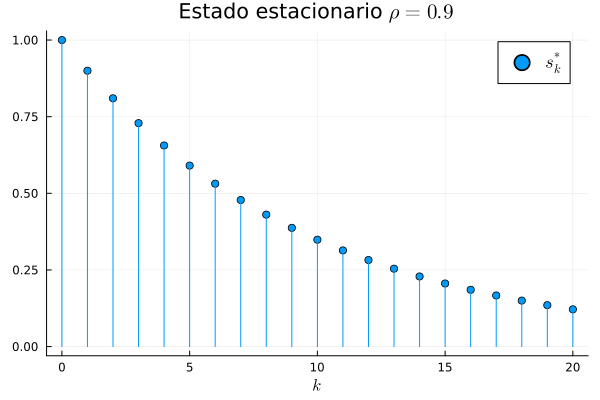

In [2]:
ρ=0.9
k=(0:20)

plot(k,ρ.^k, xlabel=L"k", label=L"s_k^*", lt=:stem, marker=:circle, legendfontsize=12, title="Estado estacionario "*L"\rho=%$ρ")

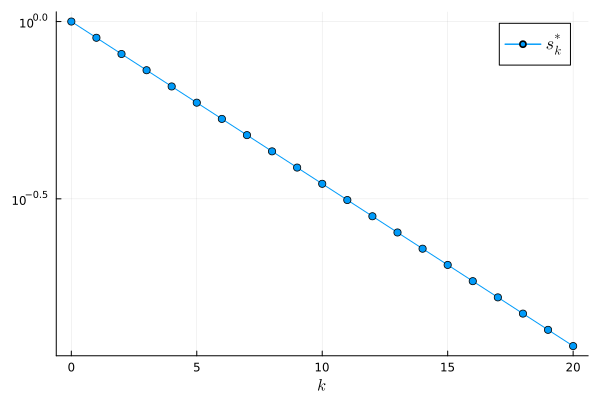

In [3]:
## En escala logarítmica
plot(k,ρ.^k, xlabel=L"k", label=L"s_k^*", marker=:circle, legendfontsize=12, yaxis=:log)

La ocupación total queda:

$$\bar{X} \approx N\sum_{k=1}^\infty s_k^* = N\frac{\rho}{1-\rho}$$

Y por lo tanto el retardo es:

$$\bar{W} = \frac{1}{\lambda}\frac{\rho}{1-\rho} = \frac{1}{\mu - \lambda},$$

como ya sabíamos.

### El caso round-robin

En este caso las colas **no son intercambiables** ya que hay un orden específico en que son servidas.

* No podemos usar un modelo de campo medio ya que $s_k$ no es un estado.
* Necesito saber el estado de cada cola específica.
* Sin embargo, ya sabemos que el comportamiento también es geométrico, aunque algo mejor que Random.

## Simulación

Hagamos ahora un código de simulación de las políticas anteriores para poder comparar las trayectorias estocásticas y validar la aproximación.

In [4]:
using Distributions

function load_balancing(N,λ,μ,Tfinal; politica=:random, d=2)

    #Estado: cantidad de clientes en cada cola. Arranca vacío
    x=zeros(UInt16,N) #lo guardo como enteros para ahorrar memoria
    t=0.0

    j=1 #para round robin
    
    X = [copy(x)];
    T = [t];
    
    dist_arrivals = Exponential(1/(N*λ))
    dist_service = Exponential(1/μ)

    nextArr = rand(dist_arrivals)
    nextDep = Inf
    nextServerCompletion = nothing   #servidor que termina el trabajo. Si está vacío no es ninguno.

    dt,caso = findmin([nextArr,nextDep])

    while(t<Tfinal)

        t=t+dt

        if caso==1 #arribo

            #aca va la política
            if politica==:random
                i = rand(DiscreteUniform(1,N))
                x[i]=x[i]+1
            elseif politica==:roundrobin
                x[j] = x[j]+1
                j=j+1
                if j==N+1
                    j=1
                end
            end

        elseif caso==2 #partida
            x[nextServerCompletion] = x[nextServerCompletion]-1
        end

        nextArr = rand(dist_arrivals)
        
        if(sum(x)>0) #hay tareas

            nextDepartures=zeros(N)
            for i=1:N
                if x[i]>0
                    nextDepartures[i] = rand(dist_service)
                else
                    nextDepartures[i] = Inf
                end
            end
            nextDep,nextServerCompletion = findmin(nextDepartures)

        else
            nextDep = Inf
            nextServerCompletion = nothing
        end

        push!(T,t)
        push!(X,copy(x))

        dt,caso = findmin([nextArr,nextDep])
    end
    
    return T,X
end

load_balancing (generic function with 1 method)

In [5]:
function extraer_proporciones(X,kmax)

    N=length(X[1]) #cantidad de servidores
    
    S = Vector{Float64}[]
    
    for i in eachindex(X)
        count = zeros(kmax)
        for k=1:kmax
            count[k] = sum(X[i].>=k) #cuento cuantas colas tienen más de k clientes
        end
        s = count/N
        push!(S,copy(s))
    end

    return S
end
            


extraer_proporciones (generic function with 1 method)

### Ejemplo: política random, $N=20$, $\rho=0.9$

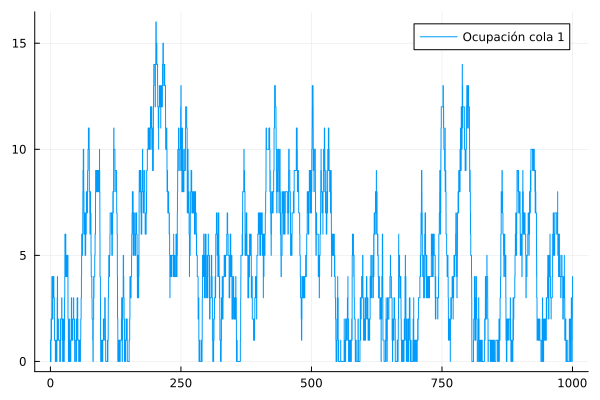

In [6]:
λ=0.9
μ=1.0
ρ=λ/μ
T,X = load_balancing(20,0.9,1.0,1000, politica=:random)
plot(T,[x[1] for x in X], label="Ocupación cola 1")

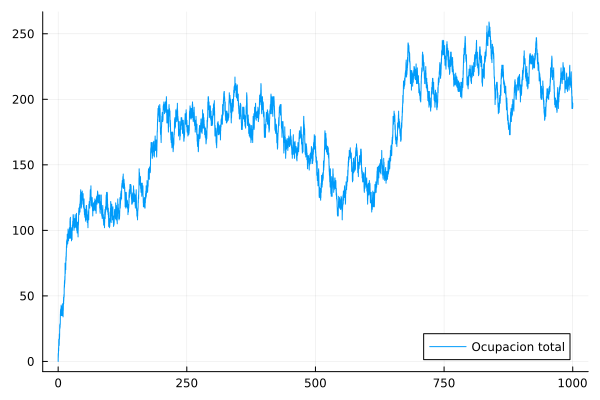

In [7]:
plot(T,[sum(x) for x in X], label="Ocupacion total")

Plots.AnimatedGif("/home/andres/Docencia/Analisis de Redes/notebooks/Tema 3 - Teoria de Colas/tmp.gif")
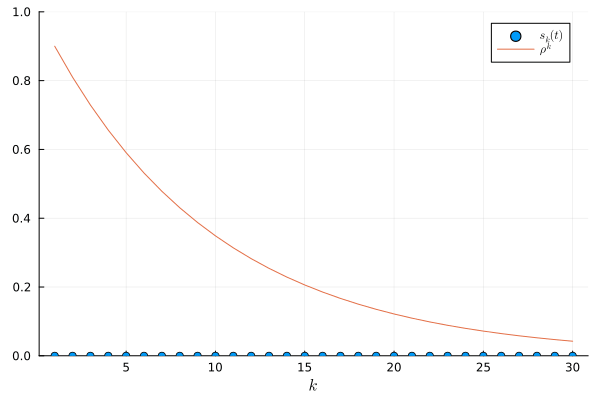

In [8]:
kmax=30
S = extraer_proporciones(X,30);
anim = @animate for i in 1:20:length(T)
    plot((1:kmax),S[i],lt=:stem, marker=:circle,ylims=(0,1), label=L"s_k(t)", xlabel=L"k")
    plot!((1:kmax),ρ.^(1:kmax), label=L"\rho^k")
end

gif(anim;fps=24,loop=1)

### Ejemplo: política round robin, $N=20$, $\rho=0.9$

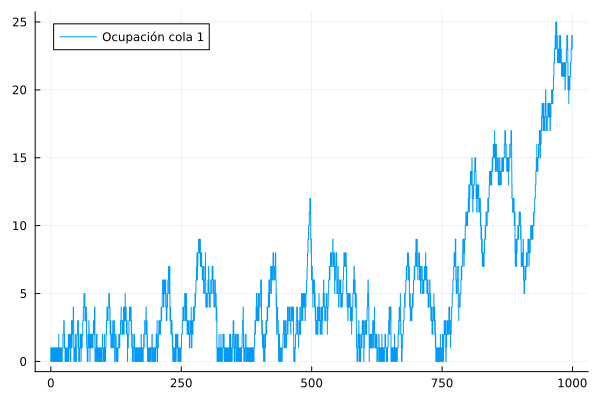

In [9]:
T,X = load_balancing(20,0.9,1.0,1000, politica=:roundrobin)
plot(T,[x[1] for x in X], label="Ocupación cola 1")

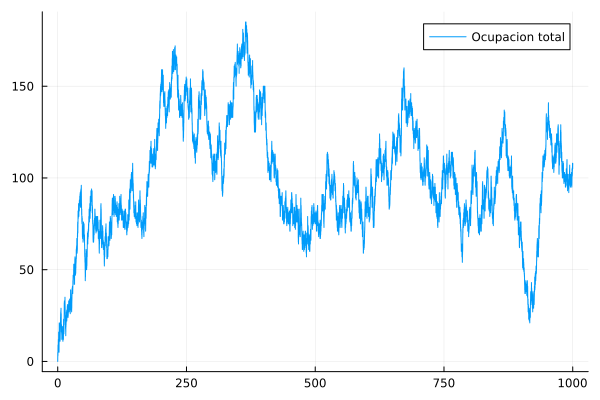

In [10]:
plot(T,[sum(x) for x in X], label="Ocupacion total")

In [11]:
using NonlinearSolve

function f(u, p)
    ρ = p[1]
    return exp(-(1-u)/ρ)-u
end

u0 = 0.0

# Set up the problem and solve
prob = NonlinearProblem(f, u0,[ρ])
sol = solve(prob)

σ = sol.u

0.8068998328558038

Plots.AnimatedGif("/home/andres/Docencia/Analisis de Redes/notebooks/Tema 3 - Teoria de Colas/tmp.gif")
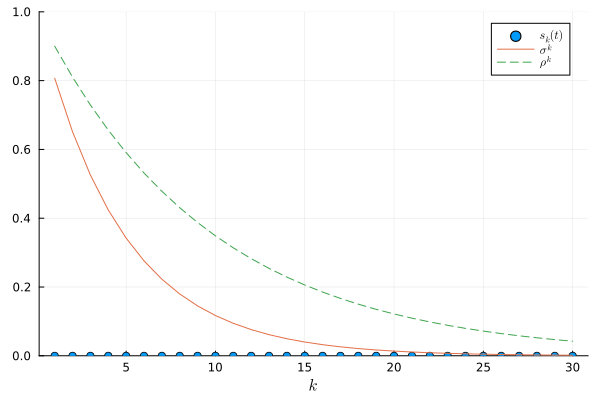

In [12]:
kmax=30
S = extraer_proporciones(X,30);
anim = @animate for i in 1:20:length(T)
    plot((1:kmax),S[i],lt=:stem, marker=:circle,ylims=(0,1), label=L"s_k(t)", xlabel=L"k")
    plot!((1:kmax),σ.^(1:kmax), label=L"\sigma^k")
    plot!((1:kmax),ρ.^(1:kmax), label=L"\rho^k", ls=:dash)
end

gif(anim;fps=24,loop=1)

## Power of $d-$choices

Esta política resultó muy popular y se debe a la siguiente observación:

* El dispatcher no puede pollear las $N$ colas para saber su estado.
* Elegir al azar no es una buena idea, queremos sesgar la elección a una cola "más corta de lo normal".

**Idea:** el load balancer averigüa el estado de un número pequeño de colas $d\ll N$, y elige enviar el trabajo a la más corta.

Notemos que la tasa de mensajes es $d$ por cada arribo, por lo que la tasa de mensajes es $O(N\lambda d) \ll O(N^2 \lambda)$.

### Modelo

Supongamos que llega un nuevo trabajo. El load balancer elige $d$ colas al azar y averigua su estado.

* Probabilidad de que todas las colas que consulta tengan más de $k$ trabajos $(S_k/N)^d$.
* Probabilidad de que todas las colas que consulta tengan más de $k-1$ trabajos $(S_{k-1}/N)^d$.

Por lo tanto, la probabilidad de que consulte $d$ colas al azar y la más pequeña tenga $k-1$ trabajos es:

$$P(\text{todas }\geqslant k-1) - P(\text{todas }\geqslant k) = s_{k-1}^d - s_k^d$$

Por lo tanto con el mismo argumento que antes, $\mathbf{S}(t) = \{S_k(t)\}$ es una cadena de Markov con tasas:

\begin{equation*}
\begin{cases}
\mathbf{S}\mapsto \mathbf{S}+\mathbf{e}_k & \text{con tasa } N\lambda (s_{k-1}^d-s_k^d)\\
\\
\mathbf{S}\mapsto \mathbf{S}-\mathbf{e}_k & \text{con tasa } \mu (S_k-S_{k+1})
\end{cases}
\end{equation*}

### Modelo de campo medio

Utilizando la misma idea, cuando $N\to\infty$ podemos tratar las magnitudes $s_k(t)$ como *fluidas* y escribir la ecuación de campo medio:

$$\dot{s}_k = \lambda(s_{k-1}^d - s_k^d) - \mu(s_k - s_{k+1}), \quad k=1,2,3,\ldots$$

Con la condición de que $s_k$ decreciente y $s_0\equiv 1$.

**Observación:** para $d=1$ coincide con la política random, ya que polleamos una única cola y no hay elección.

### Equilibrio

Nuevamente planteamos equilibrio en las ecuaciones anteriores:

$$\dot{s}_k = 0 \Longrightarrow \lambda (s_{k-1}^d - s_k^d) = \mu(s_k - s_{k+1}),\quad k=1,2,\ldots$$

Consideremos la suma desde un cierto $k$ fijo hasta infinito de estas ecuaciones, asumiendo que converge, se tiene que:

\begin{align*}
\sum_{j=k}^\infty \lambda (s_{k-1}^d - s_k^d) &= \lambda \left[s_{k-1}^d -s_k^d +s_k^d -s_{k+1}^d + s_{k+1}^d\right] - \ldots = \lambda s_{k-1}^d \\
\\
\sum_{j=k}^\infty \mu (s_{k} - s_{k+1}) &= \mu \left[s_k -s_{k+1} +s_{k+1} -s_{k+1} + s_{k+2} - \ldots\right] = \mu s_k
\end{align*}

Por lo tanto la recurrencia queda:

$$\lambda s_{k-1}^d = \mu s_k \Longleftrightarrow s_k = \rho s_{k-1}^d.$$

Comenzando en $s^*_0=1$ obtenemos:

$$s^*_1 = \rho, \quad s^*_2 = \rho \rho^d = \rho^{1+d},\quad s_3^* = \rho \rho^{1+d} = \rho^{1+d+d^2},\; \ldots$$

De donde:

$$s_k^* = \rho^{\frac{d^k-1}{d-1}}.$$

Observar que es decreciente si $\rho<1$ y cae *mucho más rápido que geométrico*. En el caso $d=1$ la fórmula no vale y hay que cambiar el exponente por $k$.

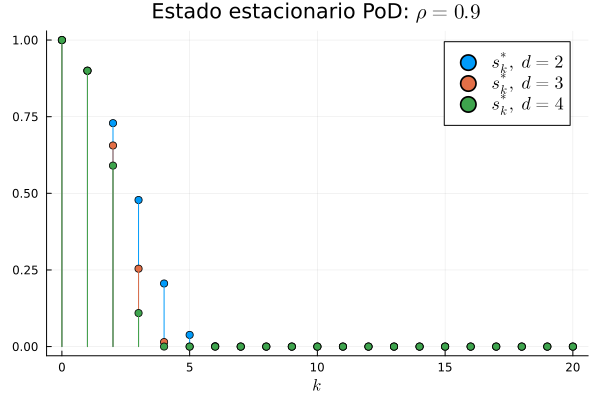

In [13]:
ρ=0.9
k=(0:20)

s_pod(k,ρ,d) = max(ρ^((d^k-1)/(d-1)),eps()) #eps es la precisión de la máquina, es para que no de 0 en escala logarítmica

plot(k,s_pod.(k,ρ,2), xlabel=L"k", label=L"s_k^*,\; d=2", lt=:stem, marker=:circle, legendfontsize=12, title="Estado estacionario PoD: "*L"\rho=%$ρ")
plot!(k,s_pod.(k,ρ,3), xlabel=L"k", label=L"s_k^*,\; d=3", lt=:stem, marker=:circle)
plot!(k,s_pod.(k,ρ,4), xlabel=L"k", label=L"s_k^*,\; d=4", lt=:stem, marker=:circle)

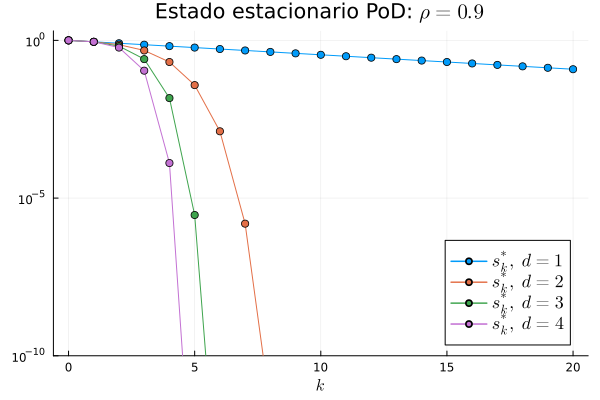

In [14]:
## En escala logarítmica
plot(k,ρ.^k, xlabel=L"k", label=L"s_k^*, \; d=1", marker=:circle, legendfontsize=12, title="Estado estacionario PoD: "*L"\rho=%$ρ", yaxis=:log10, ylims=(1e-10,2), legendposition=:bottomright)
plot!(k,s_pod.(k,ρ,2), xlabel=L"k", label=L"s_k^*,\; d=2", marker=:circle)
plot!(k,s_pod.(k,ρ,3), xlabel=L"k", label=L"s_k^*,\; d=3", marker=:circle)
plot!(k,s_pod.(k,ρ,4), xlabel=L"k", label=L"s_k^*,\; d=4", marker=:circle)

### El milagro del $d=2$

Para calcular la ocupación, y por lo tanto el retardo, deberíamos realizar la suma $\sum_{k=1}^\infty s_k^*$.

La suma anterior no tiene fórmula cerrada, pero la evaluamos numéricamente ya que decae muy rápidamente.

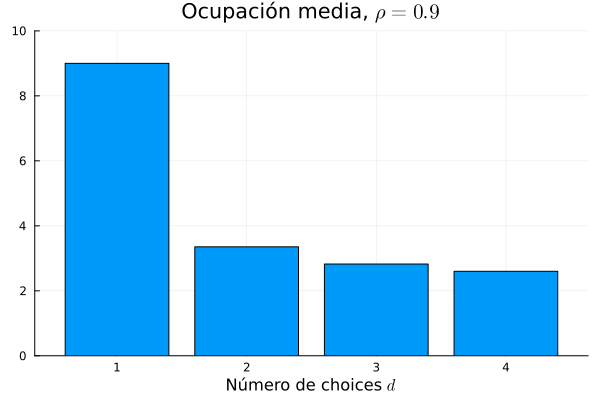

In [15]:
ρ=0.9
k=0:20

S1 = ρ/(1-ρ)
S2 = sum(s_pod.(k,ρ,2))
S3 = sum(s_pod.(k,ρ,3))
S4 = sum(s_pod.(k,ρ,4))

bar([S1,S2,S3,S4], ylims=(0,10), title="Ocupación media, "*L"\rho=%$ρ", xlabel="Número de choices "*L"d", label=:none)

El salto de $d=1$ a $d=2$ es enorme: la divergencia lineal $W \sim 1/(1-\rho)$ pasa a una divergencia logarítmica $W \sim \log(1/(1-\rho))/\log 2$. Pasar de $d=2$ a $d=3$ mejora, pero la ganancia marginal es mucho menor.

Observemos este efecto a mayor carga:

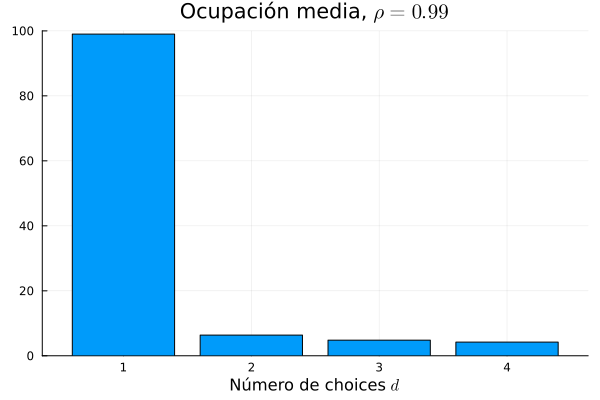

In [16]:
ρ=0.99
k=0:20

S1 = ρ/(1-ρ)
S2 = sum(s_pod.(k,ρ,2))
S3 = sum(s_pod.(k,ρ,3))
S4 = sum(s_pod.(k,ρ,4))

bar([S1,S2,S3,S4], ylims=(0,100), title="Ocupación media, "*L"\rho=%$ρ", xlabel="Número de choices "*L"d", label=:none)

## Modelo de campo medio de JSQ

Como vimos, el sistema *Join the Shortest Queue* es estable si $\rho<1$, pero no tiene solución analítica de su cadena de Markov. Analicemos el mismo sistema utilizando un modelo de campo medio.

El estado es nuevamente:

$$S_k = \#\{j : n_i \geqslant k\}, \qquad k = 0, 1, 2, \ldots,$$

la cantidad de servidores con $k$ o más trabajos. $S_0 \equiv 1$ y si el sistema es estable, $S_k\to 0$ cuando $k\to \infty$.

Supongamos que llega un nuevo trabajo. El load balancer debe elegir una de las colas más cortas del sistema. ¿Cómo modelamos esto?

**Idea:** si $S_k=1$, todas las colas tienen más de $k$ trabajos. Sea $k^*$ el primer $k$ tal que $S_{k}<1$.

Entonces $k^*-1$ es la cantidad de trabajos de la o las colas más cortas, y $S_{k^*-1} - S_{k^*}$ es la cantidad de ellas que hay en el sistema.

Por lo tanto, la evolución del sistema es:

 * Si hay un arribo (tasa $N\lambda$), elige al azar una de las $S_{k^*-1} - S_{k^*}$ colas más cortas. $S_{k^*}$ se incrementa en $1$.
 * Las partidas son como antes, $S_k$ se decrementa en $1$ cuando alguna de las $(S_k-S_{k+1})$ colas con exactamente $k$ trabajos termina a tasa $\mu$ cada una.

\begin{equation*}
\begin{cases}
\mathbf{S}\mapsto \mathbf{S}+\mathbf{e}_k^* & \text{con tasa } N\lambda\\
\\
\mathbf{S}\mapsto \mathbf{S}-\mathbf{e}_k & \text{con tasa } \mu (S_k-S_{k+1})
\end{cases}
\end{equation*}

La aproximación a primer orden de la evolución anterior es:

$$S_k = N\lambda \mathbf{1}_{\{k=k^*\}} - \mu (S_k-S_{k+1})$$

Dividiendo entre $N$, el modelo de campo medio para las fracciones de trabajos $s_k$ queda entonces:

$$\dot{s}_k = \begin{cases}
                0 & k<k^*, \\
                \\
                \lambda - \mu (s_{k+1}-s_k) & k=k^*,\\
                \\
                -\mu (s_{k+1}-s_k) & k>k^*.
                \end{cases}$$

donde usamos que $S_k-S_{k+1}=0$ para $k<k^*$

### Evolución del estado

Supongamos ahora que el sistema arranca vacío. Hacia qué equilibrio converge?

**Condición inicial:** $s_0=1$, $s_k=0$ para $k\geqslant 1$.

Por lo tanto, el primer $k$ tal que $s_k<1$ es $k^*=1$ de donde:

$$\dot{s}_1 = \lambda - \mu(s_1 - s_2) = \lambda - \mu s_1$$

y $\dot{s}_k = 0$ para $k\geqslant 2$ ya que $s_k=s_{k+1}=0$.

### Equilibrio de JSQ

La ecuación anterior es una ecuación de primer orden para $s_1$ que converge exponencialmente al equilibrio:

$$s^*_1:  \lambda - \mu s_1 = 0 \Rightarrow s_1^* = \rho < 1.$$

Como $s^*_1<1$, $k^*$ sigue siendo $1$ y nunca hay colas con más de un trabajo. El equilibrio completo es:

$$s^*_0 = 1, \qquad s^*_1 = \rho, \qquad s_k^* = 0 \quad \forall k\geqslant 2.$$ 

**Observación:** esto es una aproximación. En la práctica como veremos aparecen colas con más de un trabajo. Pero si $N$ es grande, la probabilidad de que esto ocurra tiende a $0$.

### El sistema ideal

Claramente el sistema anterior es ideal:

 * $s_0^* = 1$ por construcción, todas las colas tienen al menos $0$ trabajos.
 * $s^*_1$ es la fracción de colas que están trabajando (con $1$ o más trabajos). Si el sistema es estable debe ser igual a $\rho$ en promedio.

Entonces el sistema anterior mantiene $\rho$ colas trabajando, pero ninguna con más de $1$ trabajo (en el límite).

Por lo tanto, el retardo es mínimo: es el retardo del propio trabajo

$$\bar{W} = \frac{1}{\mu}.$$

## Join the Idle Queue (JIQ)

El problema del sistema anterior es que tenemos que conocer el estado de todas las colas. Queremos mejorar esto.

**Idea:** Apoyarse en la observación anterior, si $\rho<1$ en equilibrio hay una fracción $\rho$ de colas trabajando, y por lo tanto una fracción $1-\rho>0$ de colas vacías.

Ello lleva a la siguiente política:

> **Join the idle queue**:
>
> * Cuando llega un trabajo (tasa $N\lambda$) se lo asigna a una de las colas vacías.
> * Si no hay ninguna se elige una al azar como en random.

### Mensajes en JIQ

Pensemos ahora en el costo de implementar esta política:

 * El sistema debe mantener una lista de las colas vacías a las que rutear.
 * Cada vez que envía a una cola vacía, la borra de la lista.
 * Cada vez que una cola queda vacía, envía un mensaje al load balancer avisando y éste la agrega a la lista.

Para calcular la tasa de mensajes necesitamos saber cómo se comporta este sistema en estado estacionario.

## Modelo de campo medio de JIQ

Sigamos la misma idea de utilizar modelos de campo medio. Adaptemos el modelo de JSQ a este caso.

El estado es nuevamente:

$$S_k = \#\{j : n_i \geqslant k\}, \qquad k = 0, 1, 2, \ldots,$$

la cantidad de servidores con $k$ o más trabajos. $S_0 \equiv 1$ y si el sistema es estable, $S_k\to 0$ cuando $k\to \infty$.

Supongamos que llega un nuevo trabajo. El load balancer se pregunta: ¿hay una cola vacía? 

**Idea:** hay una cola vacía si y solo si $S_1<N$

Por lo tanto, la evolución del sistema es:

 * Si hay un arribo (tasa $N\lambda$), elige al azar una de las $S_{0} - S_{1}$ colas vacías. $S_{1}$ se incrementa en $1$.
 * Las partidas son como antes, $S_k$ se decrementa en $1$ cuando alguna de las $(S_k-S_{k+1})$ colas con exactamente $k$ trabajos termina a tasa $\mu$ cada una.
 * Si $S_1=N$, hace lo mismo que random.

\begin{equation*}
\begin{cases}
\mathbf{S}\mapsto \mathbf{S}+\mathbf{e}_1 & \text{con tasa } N\lambda\mathbf{1}_{\{S_1<N\}} \qquad \text{hay colas vacías, solo se incrementa $S_1$.}\\
\\
\mathbf{S}\mapsto \mathbf{S}+\mathbf{e}_k & \text{con tasa } \lambda (S_{k-1}-S_{k}) \mathbf{1}_{\{S_1=N\}} \qquad k\geqslant 2 \qquad \text{no hay colas vacías, ruteo al azar.}\\
\\
\mathbf{S}\mapsto \mathbf{S}-\mathbf{e}_k & \text{con tasa } \mu (S_k-S_{k+1})
\end{cases}
\end{equation*}

La aproximación a primer orden de la evolución anterior es:

$$S_1 = N\lambda \mathbf{1}{\{S_1<N\}} - \mu (S_1-S_2)$$

$$S_k = N\lambda \mathbf{1}{\{S_1=N\}} - \mu (S_k-S_{k+1})$$

Dividiendo entre $N$, el modelo de campo medio para las fracciones de trabajos $s_k$ queda entonces:

$$\dot{s}_k = \begin{cases}
                \lambda\mathbf{1}_{\{s_1<1\}} - \mu (s_{1}-s_2) & k=1\\
                \\
                \lambda(s_{k-1}-s_k)\mathbf{1}_{\{s_1=1\}}-\mu (s_{k+1}-s_k) & k\geqslant 2.
                \end{cases}$$

### Evolución del estado

Supongamos ahora que el sistema arranca vacío. Hacia qué equilibrio converge?

**Condición inicial:** $s_0=1$, $s_k=0$ para $k\geqslant 1$.

Por lo tanto, $s_1<1$ y hay colas vacías,de donde:

$$\dot{s}_1 = \lambda - \mu(s_1 - s_2) = \lambda - \mu s_1$$

y $\dot{s}_k = 0$ para $k\geqslant 2$ ya que $s_k=s_{k+1}=0$.

**La misma evolución que para JSQ!**

### Equilibrio de JIQ - coincide con JSQ.

La ecuación anterior es una ecuación de primer orden para $s_1$ que converge exponencialmente al equilibrio:

$$s^*_1:  \lambda - \mu s_1 = 0 \Rightarrow s_1^* = \rho < 1.$$

Como $s^*_1<1$, $k^*$ sigue siendo $1$ y nunca hay colas con más de un trabajo. El equilibrio completo es:

$$s^*_0 = 1, \qquad s^*_1 = \rho, \qquad s_k^* = 0 \quad \forall k\geqslant 2.$$ 

**Observación:** nuevamente, esto es una aproximación. En la práctica, cuando $\rho\approx 1$, el sistema opera más tiempo ruteando al azar y su performance disminuye!.

### Carga de implementación.

* En equilibrio hay una proporción $\rho$ de colas trabajando.
* Cada una de ellas termina a tasa $\mu$.

Por lo tanto, la tasa a la que las colas quedan vacías es $N\rho\mu=N\lambda$. Es decir, básicamente la implementación requiere $O(N\lambda)$ mensajes o $1$ mensaje por trabajo (comparado con $d$ en PoD).

**Conclusión:** si $\rho<1$ (en la práctica, no muy cercano a $1$), podemos lograr la performance de JSQ utilizando solo $O(N\lambda)$ mensajes!


## Ejercicio

  1. Extender el simulador visto en clase para incorporar las políticas:
     
        > **Power of $d$:** El dispatcher elige $d$ servidores al azar y envía el trabajo al que tenga la cola más corta de los $d$.

        > **Join-the-shortest-queue, JSQ:** El dispatcher conoce el estado de congestión de cada servidor, y elige enviar la tarea al servidor con menor cantidad de trabajos (si hay varios empatados elige al azar).

        > **Join-the-idle-queue, JIQ:** El dispatcher conoce solamente cuáles servidores están libres en ese momento. Si hay libres, elige uno al azar entre ellos. Si todos están ocupados, elige al azar uno cualquiera

  2. Discuta las tres políticas de forma cualitativa, y analice cuál debería ser la más eficiente.

  3. Simule las 3 políticas para $N=30$, $\rho=0.9$ y $\mu=1.0$. Elija un tiempo final de simulación adecuado.

  4. Compare el desempeño obtenido por las 3. En particular:

     * Compare la evolución del estado $s_k$, proporción de colas con más de $k$ clientes de Power of $d$ con la curva teórica hallada (utilice $d=2$ y $d=3$)
     * Compare JSQ con JIQ, que es más simple. ¿Logra aproximar los resultados de la política JSQ con menos información?

  
  5. Repita la comparación de JSQ y JIQ para $\rho=0.95$. ¿Qué ocurre?
